# MT_ER

In [1]:
# Check Pytorch installation
# import mmseg, math
from PIL import Image
import numpy as np
import os.path as osp
import matplotlib.pyplot as plt
import mmcv
import torch, torchvision

print(torch.__version__, torch.cuda.is_available())
# print(mmseg.__version__)

# %cd /home/smlm-workstation/segmentation/mmsegmentation/
%cd /home/smlm-workstation/segmentation/ViTAE-Transformer-Remote-Sensing/SemanticSegmentation

# split train/val set randomly
img_dir = 'images'
ann_dir = 'bit_masks'

data_root = '/home/smlm-workstation/segmentation/data/full_combined_mt_det_er_summed/'
# data_root = '/home/smlm-workstation/segmentation/ViTAE-Transformer-Remote-Sensing/SemanticSegmentation'

class dotdict(dict):
    """dot.notation access to dictionary attributes"""
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

1.10.1 True
/home/smlm-workstation/segmentation/ViTAE-Transformer-Remote-Sensing/SemanticSegmentation


In [2]:
# split_dir = 'splits'
# mmcv.mkdir_or_exist(osp.join(data_root, split_dir))
# filename_list = [osp.splitext(filename)[0] for filename in mmcv.scandir(
#     osp.join(data_root, img_dir), suffix='.png')]
# with open(osp.join(data_root, split_dir, 'train.txt'), 'w') as f:
#   # select first 4/5 as train set
#   train_length = int(len(filename_list)*199/200)
#   f.writelines(line + '\n' for line in filename_list[:train_length])
# with open(osp.join(data_root, split_dir, 'val.txt'), 'w') as f:
#   # select last 1/5 as test set
#   f.writelines(line + '\n' for line in filename_list[train_length:])

In [3]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

@DATASETS.register_module()
class SMLM_mt_ER_background(CustomDataset):
  CLASSES = ('Background','Microtubule', 'ER')
  PALETTE = [[10,10,10], [128, 255, 0], [255, 255, 128]]
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split,
                     reduce_zero_label=False,
                     **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [4]:
# from mmseg.datasets.builder import DATASETS
# from mmseg.datasets.custom import CustomDataset


# @DATASETS.register_module()
# class SMLM_mt_ER(CustomDataset):
#   CLASSES = ('Microtubule', 'ER')
#   PALETTE = [[128, 255, 0], [255, 255, 128]]

#   def __init__(self, split, **kwargs):
#     super().__init__(img_suffix='.png', seg_map_suffix='.png',
#                      split=split,
#                      reduce_zero_label=True,
#                      **kwargs)
#     assert osp.exists(self.img_dir) and self.split is not None


In [5]:
# !wget https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b2_512x512_160k_ade20k/segformer_mit-b2_512x512_160k_ade20k_20220620_114047-64e4feca.pth -P /home/smlm-workstation/segmentation/mmsegmentation/checkpoints

In [6]:
from distutils.fancy_getopt import FancyGetopt
from mmseg.apis import set_random_seed
from mmcv import Config

cfg = Config.fromfile(
    'configs/vit_base_win/upernet_vitae_nc_base_rvsa_v3_wsz7_512x512_160k_potsdam_rgb_dpr10_lr6e5_lrd90_ps16_class5_ignore5.py')

# cfg = Config.fromfile(
#     'configs/vit_base_win/upernet_vit_base_win_rvsa_v3_kvdiff_512x512_160k_potsdam_rgb_dpr10_lr6e5_lrd90_ps16_class5_ignore5.py')

# cfg = Config.fromfile(
#     'configs/vit_base_win/upernet_vitae_nc_base_rvsa_v3_kvdiff_wsz7_512x512_160k_potsdam_rgb_dpr10_lr6e5_lrd90_ps16_class5_ignore5.py')

# cfg = Config.fromfile(
# 'configs/segformer/segformer_mit-b1_512x512_160k_ade20k.py')

# Since we use only one GPU, BN is used instead of SyncBN
cfg.norm_cfg = dict(type='BN', requires_grad=True)
# cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg
cfg.model.auxiliary_head.norm_cfg = cfg.norm_cfg
# cfg.model.neck.norm_cfg = cfg.norm_cfg
# modify num classes of the model in decode/auxiliary head
cfg.model.decode_head.num_classes = 3
cfg.model.auxiliary_head.num_classes = 3
# cfg.model.pretrained = 'checkpoints/vitae-b-checkpoint-1599-transform-no-average.pth'

# cfg.model.test_cfg = dotdict(
#     mode='slide', crop_size=(256, 256), stride=(200, 200))

# cfg.model.test_cfg = dotdict(mode='slide', crop_size=(128, 128), stride=(127, 127))
# cfg.model.auxiliary_head.num_classes = 3

# cfg.model.test_cfg = dotdict(mode='slide', crop_size=(256, 256), stride=(1, 1))
# cfg.model.test_cfg = dotdict(
#     mode='whole')

# cfg.model.auxiliary_head.loss_decode = dict(
#     type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0, avg_non_ignore=True, class_weight=[0.05, 0.55, 0.45])
# cfg.model.decode_head.loss_decode = [dict(type='CrossEntropyLoss', loss_name='loss_ce', loss_weight=1.0),
#                                      dict(type='DiceLoss', use_sigmoid=False, loss_weight=1.0)]
                                    #  dict(type='TverskyLoss', loss_name='TverskyLoss', loss_weight=3.0)]

# cfg.model.decode_head.loss_decode = dict(type='CrossEntropyLoss', use_sigmoid=False, class_weight=[0.3504681, 0.6460288])
# cfg.model.decode_head.loss_decode = dict(type='DiceLoss', use_sigmoid=True)
# cfg.model.decode_head.loss_decode = dict(type='DiceLoss', use_sigmoid=True, class_weight=[0.35, 0.64])
# cfg.model.decode_head.loss_decode = [dict(type='FocalLoss', use_sigmoid=True, alpha=.25)]

cfg.model.decode_head.loss_decode = [dict(type='FocalLoss', use_sigmoid=True, alpha=.25, loss_weight=0.2),
                                     dict(type='DiceLoss', loss_weight=0.8)]

cfg.model.auxiliary_head.loss_decode = [dict(type='FocalLoss', use_sigmoid=True, alpha=.25, loss_weight=0.2),
                                        dict(type='DiceLoss', loss_weight=0.2)]

# cfg.model.decode_head.loss_decode = [dict(type='DiceLoss', loss_weight=1.0)]

# cfg.model.auxiliary_head.loss_decode = [dict(type='DiceLoss', loss_weight=0.4)]

# cfg.model.decode_head.loss_decode = dict(
#     type='PhiLoss', loss_weight=1.0, gamma=0.5)

# cfg.model.decode_head.loss_decode = dict(
#     type='TverskyLoss', class_weight=[0.2, 0.3, 0.5])

# cfg.model.auxiliary_head.ignore_index = 0
# cfg.model.decode_head.ignore_index = 0

# Modify dataset type and path
# cfg.dataset_type = 'SMLM_mt_ER'
cfg.dataset_type = 'SMLM_mt_ER_background'
cfg.data_root = data_root
# cfg.reduce_zero_label = True

cfg.data.samples_per_gpu = 2
cfg.data.workers_per_gpu = 12

img_norm_cfg = dict(
mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=False)
crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations', reduce_zero_label=False),
    # dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=crop_size, cat_max_ratio=0.8),
    # dict(type='RandomRotate', prob=0.5, degree=35),
    dict(type='RandomFlip', prob=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **img_norm_cfg),
    dict(type='Pad', size=(512, 512), pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg'])
]
cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=None,
        img_ratios=[1.0],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img'])
        ])
]

cfg.data.train.type = cfg.dataset_type
cfg.data.train.data_root = cfg.data_root
# cfg.data.train.reduce_zero_label = cfg.reduce_zero_label
cfg.data.train.img_dir = img_dir
cfg.data.train.ann_dir = ann_dir
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = 'splits/train.txt'

cfg.data.val.type = cfg.dataset_type
cfg.data.val.data_root = cfg.data_root
# cfg.data.val.reduce_zero_label = cfg.reduce_zero_label
cfg.data.val.img_dir = img_dir
cfg.data.val.ann_dir = ann_dir
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = 'splits/val.txt'

cfg.data.test.type = cfg.dataset_type
cfg.data.test.data_root = cfg.data_root
# cfg.data.test.reduce_zero_label = cfg.reduce_zero_label
cfg.data.test.img_dir = img_dir
cfg.data.test.ann_dir = ann_dir
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = 'splits/val.txt'

# cfg.log_config = dict(  
#     interval=50,  
#     hooks=[
#         dict(type='TextLoggerHook', by_epoch=False),
#         # dict(type='TensorboardLoggerHook', by_epoch=False),
#         # dict(type='NeptuneLoggerHook', by_epoch=False) 
#         # MMSegWandbHook is mmseg implementation of WandbLoggerHook. ClearMLLoggerHook, DvcliveLoggerHook, MlflowLoggerHook, NeptuneLoggerHook, PaviLoggerHook, SegmindLoggerHook are also supported based on MMCV implementation.
#     ])
cfg.log_config.interval = 500
cfg.runner.max_iters = 160000
cfg.evaluation.interval = 4000
cfg.checkpoint_config.interval = 2000

# cfg.resume_from = 'work_dirs/segformer_b1_adamW_16k/iter_16000.pth'
# cfg.load_from = 'work_dirs/segformer_b1_adamW_16k/iter_16000.pth'
# cfg.load_from = 'checkpoints/vitae_rvsa_Potsdam_91.22.pth'
# cfg.load_from = 'checkpoints/vitae_rvsa_kvdiff_potsdam_91.pth'

# cfg.resume_from = 'work_dirs/ViTAE_UperNet_Potsdam_512_MT_ER/latest.pth'
cfg.resume_from = 'work_dirs/ViTAE_UperNet_Potsdam_512_MT_ER_dice_focal_40k/latest.pth'

# cfg.load_from = 'checkpoints/segformer_mit-b1_512x512_160k_ade20k_20220620_112037-c3f39e00.pth'
# cfg.load_from = 'checkpoints/segformer_mit-b2_512x512_160k_ade20k_20220620_114047-64e4feca.pth'
# cfg.load_from = 'checkpoints/deeplabv3plus_r18-d8_512x512_80k_potsdam_20211219_020601-75fd5bc3.pth'
# cfg.load_from = 'checkpoints/deeplabv3plus_r50-d8_4x4_512x512_80k_vaihingen_20211231_230816-5040938d.pth'
# cfg.load_from = 'checkpoints/deeplabv3plus_r101-d8_512x512_80k_potsdam_20211219_031508-8b112708.pth'
# cfg.load_from = 'checkpoints/deeplabv3plus_r101-d8_4x4_512x512_80k_vaihingen_20211231_230816-8a095afa.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './work_dirs/ViTAE_UperNet_Potsdam_512_MT_ER_dice_focal_40k'

# optimizer = dict(
#     _delete_=True,
#     type='AdamW',
#     lr=0.000005,
#     betas=(0.9, 0.999),
#     weight_decay=0.01,
#     paramwise_cfg=dict(
#         custom_keys={
#             'pos_block': dict(decay_mult=0.),
#             'norm': dict(decay_mult=0.),
#             'head': dict(lr_mult=10.)
#         }))

# lr_config = dict(
#     _delete_=True,
#     policy='poly',
#     warmup='linear',
#     warmup_iters=500,
#     warmup_ratio=1e-6,
#     power=1.0,
#     min_lr=0.0,
#     by_epoch=False)

# cfg.optimizer = dict(type='SGD', lr=0.001, momentum=0.9, weight_decay=0.0005,
#                      paramwise_cfg=dict(custom_keys={'head': dict(lr_mult=10.)}))

# cfg.optimizer_config = dict(grad_clip=dict(max_norm=35, norm_type=2))

# cfg.lr_config=dict(
#     policy='cyclic',
#     target_ratio=(10, 1e-5),
#     cyclic_times=1,
#     step_ratio_up=0.4,
# )
# cfg.momentum_config=dict(
#     policy='cyclic',
#     target_ratio=(0.85 / 0.95, 1),
#     cyclic_times=1,
#     step_ratio_up=0.4,
# )

# Set seed to facitate reproducing the result
cfg.seed = 42
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device = 'cuda'
cfg.cudnn_benchmark = True

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=
    '../mae-main/output/mae_vitae_base_pretrn/millionAID_224/1600_0.75_0.00015_0.05_2048/checkpoint-1599-transform-no-average.pth',
    backbone=dict(
        type='ViTAE_NC_Win_RVSA_V3_WSZ7',
        img_size=512,
        embed_dim=768,
        depth=12,
        num_heads=12,
        mlp_ratio=4,
        qkv_bias=True,
        qk_scale=None,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        use_abs_pos_emb=True,
        patch_size=16,
        out_indices=[3, 5, 7, 11]),
    decode_head=dict(
        type='UPerHead',
        in_channels=[768, 768, 768, 768],
        in_index=[0, 1, 2, 3],
        pool_scales=(1, 2, 3, 6),
        channels=512,
        dropout_ratio=0.1,
        num_classes=3,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=[
            dict(
                type='Foca

In [7]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor


# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(cfg.model)#.cuda().eval()
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES
model.PALETTE = datasets[0].PALETTE

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True, 
                meta=dict())

# torch.cuda.empty_cache()

2022-11-25 11:24:36,097 - mmseg - INFO - Loaded 1671 images
/home/smlm-workstation/miniconda3/envs/vitae/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1639180588308/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


The relative_pos_embedding is used
The relative_pos_embedding is used
The relative_pos_embedding is used
The relative_pos_embedding is used
The relative_pos_embedding is used
The relative_pos_embedding is used
The relative_pos_embedding is used
The relative_pos_embedding is used


2022-11-25 11:24:40,123 - mmseg - INFO - Loaded 9 images
2022-11-25 11:24:40,124 - mmseg - INFO - load checkpoint from local path: work_dirs/ViTAE_UperNet_Potsdam_512_MT_ER_dice_focal_40k/latest.pth


{'num_layers': 12, 'layer_decay_rate': 0.9}
Build LayerDecayOptimizerConstructor 0.900000 - 14
Param groups = {
  "layer_0_no_decay": {
    "param_names": [
      "backbone.pos_embed",
      "backbone.patch_embed.proj.bias"
    ],
    "lr_scale": 0.2541865828329001,
    "lr": 1.5251194969974005e-05,
    "weight_decay": 0.0
  },
  "layer_0_decay": {
    "param_names": [
      "backbone.patch_embed.proj.weight"
    ],
    "lr_scale": 0.2541865828329001,
    "lr": 1.5251194969974005e-05,
    "weight_decay": 0.05
  },
  "layer_1_no_decay": {
    "param_names": [
      "backbone.blocks.0.norm1.weight",
      "backbone.blocks.0.norm1.bias",
      "backbone.blocks.0.attn.rel_pos_h",
      "backbone.blocks.0.attn.rel_pos_w",
      "backbone.blocks.0.attn.q_bias",
      "backbone.blocks.0.attn.v_bias",
      "backbone.blocks.0.attn.sampling_offsets.2.bias",
      "backbone.blocks.0.attn.sampling_scales.2.bias",
      "backbone.blocks.0.attn.sampling_angles.2.bias",
      "backbone.blocks.0.attn

2022-11-25 11:24:40,984 - mmseg - INFO - resumed from epoch: 87, iter 79999
2022-11-25 11:24:40,985 - mmseg - INFO - Start running, host: smlm-workstation@smlmworkstation, work_dir: /home/smlm-workstation/segmentation/ViTAE-Transformer-Remote-Sensing/SemanticSegmentation/work_dirs/ViTAE_UperNet_Potsdam_512_MT_ER_dice_focal_40k
2022-11-25 11:24:40,986 - mmseg - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) PolyLrUpdaterHook                  
(NORMAL      ) CheckpointHook                     
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) PolyLrUpdaterHook                  
(LOW         ) IterTimerHook                      
(LOW         ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_iter:
(VERY_HIGH   ) PolyLrUpdaterHook                  
(LOW         ) IterTimerHoo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 157s, ETA:     0s

2022-11-25 11:27:24,768 - mmseg - INFO - per class results:
2022-11-25 11:27:24,769 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.17 | 97.85 | 97.53  |   97.21   | 97.85  |
| Microtubule | 28.88 | 38.19 | 44.82  |   54.24   | 38.19  |
|      ER     | 50.34 |  71.9 | 66.96  |   62.66   |  71.9  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 11:27:24,769 - mmseg - INFO - Summary:
2022-11-25 11:27:24,770 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.03 | 58.13 | 69.31 |  69.77  |   71.37    |  69.31  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 11:27:24,770 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9503, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 152s, ETA:     0s

2022-11-25 11:56:39,637 - mmseg - INFO - per class results:
2022-11-25 11:56:39,639 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 94.32 | 96.57 | 97.08  |   97.59   | 96.57  |
| Microtubule | 28.97 | 46.79 | 44.92  |    43.2   | 46.79  |
|      ER     | 48.79 | 73.45 | 65.59  |   59.24   | 73.45  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 11:56:39,639 - mmseg - INFO - Summary:
2022-11-25 11:56:39,640 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 94.18 | 57.36 | 72.27 |   69.2  |   66.67    |  72.27  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 11:56:39,640 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9418, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 152s, ETA:     0s

2022-11-25 12:21:23,009 - mmseg - INFO - per class results:
2022-11-25 12:21:23,011 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 94.83 | 97.14 | 97.35  |   97.56   | 97.14  |
| Microtubule | 30.81 |  45.4 |  47.1  |   48.95   |  45.4  |
|      ER     | 49.99 | 74.37 | 66.66  |    60.4   | 74.37  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 12:21:23,012 - mmseg - INFO - Summary:
2022-11-25 12:21:23,012 - mmseg - INFO - 
+-------+-------+------+---------+------------+---------+
|  aAcc |  mIoU | mAcc | mFscore | mPrecision | mRecall |
+-------+-------+------+---------+------------+---------+
| 94.68 | 58.55 | 72.3 |  70.37  |   68.97    |   72.3  |
+-------+-------+------+---------+------------+---------+
2022-11-25 12:21:23,012 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9468, mIoU: 0.5855,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 153s, ETA:     0s

2022-11-25 12:45:58,308 - mmseg - INFO - per class results:
2022-11-25 12:45:58,310 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 94.88 |  97.3 | 97.38  |   97.45   |  97.3  |
| Microtubule | 30.34 | 43.94 | 46.56  |   49.51   | 43.94  |
|      ER     | 49.87 | 72.91 | 66.55  |   61.21   | 72.91  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 12:45:58,310 - mmseg - INFO - Summary:
2022-11-25 12:45:58,311 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 94.74 | 58.36 | 71.38 |  70.16  |   69.39    |  71.38  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 12:45:58,311 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9474, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 149s, ETA:     0s

2022-11-25 13:11:27,407 - mmseg - INFO - per class results:
2022-11-25 13:11:27,409 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 94.61 | 97.06 | 97.23  |    97.4   | 97.06  |
| Microtubule | 29.16 | 48.99 | 45.16  |   41.88   | 48.99  |
|      ER     | 45.34 | 59.56 | 62.39  |    65.5   | 59.56  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 13:11:27,409 - mmseg - INFO - Summary:
2022-11-25 13:11:27,410 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 94.31 | 56.37 | 68.54 |  68.26  |   68.26    |  68.54  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 13:11:27,410 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9431, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 151s, ETA:     0s

2022-11-25 13:36:01,106 - mmseg - INFO - per class results:
2022-11-25 13:36:01,109 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.11 | 97.65 |  97.5  |   97.34   | 97.65  |
| Microtubule | 29.93 |  40.4 | 46.08  |   53.61   |  40.4  |
|      ER     | 50.21 | 73.49 | 66.85  |   61.31   | 73.49  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 13:36:01,109 - mmseg - INFO - Summary:
2022-11-25 13:36:01,110 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 94.96 | 58.42 | 70.51 |  70.14  |   70.76    |  70.51  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 13:36:01,110 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9496, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 150s, ETA:     0s

2022-11-25 14:00:42,961 - mmseg - INFO - per class results:
2022-11-25 14:00:42,963 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 94.67 | 96.92 | 97.26  |   97.61   | 96.92  |
| Microtubule | 30.71 | 47.81 | 46.99  |   46.19   | 47.81  |
|      ER     | 49.16 | 72.22 | 65.91  |   60.62   | 72.22  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 14:00:42,963 - mmseg - INFO - Summary:
2022-11-25 14:00:42,963 - mmseg - INFO - 
+------+-------+-------+---------+------------+---------+
| aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+------+-------+-------+---------+------------+---------+
| 94.5 | 58.18 | 72.31 |  70.05  |   68.14    |  72.31  |
+------+-------+-------+---------+------------+---------+
2022-11-25 14:00:42,964 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9450, mIoU: 0.5818,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 153s, ETA:     0s

2022-11-25 14:26:17,355 - mmseg - INFO - per class results:
2022-11-25 14:26:17,357 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 94.99 | 97.39 | 97.43  |   97.47   | 97.39  |
| Microtubule |  30.8 | 43.93 | 47.09  |   50.74   | 43.93  |
|      ER     | 50.06 |  73.1 | 66.72  |   61.36   |  73.1  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 14:26:17,357 - mmseg - INFO - Summary:
2022-11-25 14:26:17,358 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 94.84 | 58.62 | 71.47 |  70.41  |   69.86    |  71.47  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 14:26:17,358 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9484, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 151s, ETA:     0s

2022-11-25 14:51:06,277 - mmseg - INFO - per class results:
2022-11-25 14:51:06,279 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background |  95.2 | 97.64 | 97.54  |   97.45   | 97.64  |
| Microtubule | 31.57 | 42.81 | 47.99  |   54.59   | 42.81  |
|      ER     |  50.7 | 74.03 | 67.29  |   61.67   | 74.03  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 14:51:06,279 - mmseg - INFO - Summary:
2022-11-25 14:51:06,280 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.05 | 59.16 | 71.49 |  70.94  |   71.24    |  71.49  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 14:51:06,280 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9505, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 153s, ETA:     0s

2022-11-25 15:15:45,288 - mmseg - INFO - per class results:
2022-11-25 15:15:45,289 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.27 | 97.82 | 97.58  |   97.33   | 97.82  |
| Microtubule | 31.09 | 41.56 | 47.43  |   55.23   | 41.56  |
|      ER     | 51.01 | 72.22 | 67.56  |   63.47   | 72.22  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 15:15:45,290 - mmseg - INFO - Summary:
2022-11-25 15:15:45,290 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.13 | 59.12 | 70.53 |  70.86  |   72.01    |  70.53  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 15:15:45,290 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9513, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 159s, ETA:     0s

2022-11-25 15:41:22,655 - mmseg - INFO - per class results:
2022-11-25 15:41:22,656 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 94.94 | 97.09 | 97.41  |   97.73   | 97.09  |
| Microtubule | 33.02 | 49.52 | 49.65  |   49.77   | 49.52  |
|      ER     | 50.91 | 74.96 | 67.47  |   61.34   | 74.96  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 15:41:22,656 - mmseg - INFO - Summary:
2022-11-25 15:41:22,656 - mmseg - INFO - 
+------+-------+-------+---------+------------+---------+
| aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+------+-------+-------+---------+------------+---------+
| 94.8 | 59.62 | 73.85 |  71.51  |   69.61    |  73.85  |
+------+-------+-------+---------+------------+---------+
2022-11-25 15:41:22,657 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9480, mIoU: 0.5962,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 152s, ETA:     0s

2022-11-25 16:06:33,185 - mmseg - INFO - per class results:
2022-11-25 16:06:33,186 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.29 | 97.83 | 97.59  |   97.35   | 97.83  |
| Microtubule | 30.68 | 39.43 | 46.95  |   58.01   | 39.43  |
|      ER     | 51.26 | 75.63 | 67.78  |    61.4   | 75.63  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 16:06:33,186 - mmseg - INFO - Summary:
2022-11-25 16:06:33,187 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.16 | 59.08 | 70.96 |  70.77  |   72.25    |  70.96  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 16:06:33,187 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9516, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 150s, ETA:     0s

2022-11-25 16:31:16,073 - mmseg - INFO - per class results:
2022-11-25 16:31:16,074 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.31 |  97.8 |  97.6  |    97.4   |  97.8  |
| Microtubule | 32.04 |  42.6 | 48.53  |   56.38   |  42.6  |
|      ER     | 51.25 | 73.28 | 67.77  |   63.03   | 73.28  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 16:31:16,075 - mmseg - INFO - Summary:
2022-11-25 16:31:16,075 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.18 | 59.53 | 71.23 |   71.3  |   72.27    |  71.23  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 16:31:16,075 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9518, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 160s, ETA:     0s

2022-11-25 16:57:17,319 - mmseg - INFO - per class results:
2022-11-25 16:57:17,321 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.19 | 97.55 | 97.53  |   97.52   | 97.55  |
| Microtubule | 32.26 | 43.47 | 48.78  |   55.58   | 43.47  |
|      ER     | 50.92 | 76.18 | 67.48  |   60.56   | 76.18  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 16:57:17,321 - mmseg - INFO - Summary:
2022-11-25 16:57:17,321 - mmseg - INFO - 
+-------+-------+------+---------+------------+---------+
|  aAcc |  mIoU | mAcc | mFscore | mPrecision | mRecall |
+-------+-------+------+---------+------------+---------+
| 95.05 | 59.45 | 72.4 |  71.26  |   71.22    |   72.4  |
+-------+-------+------+---------+------------+---------+
2022-11-25 16:57:17,322 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9505, mIoU: 0.5945,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 153s, ETA:     0s

2022-11-25 17:22:53,417 - mmseg - INFO - per class results:
2022-11-25 17:22:53,419 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.29 | 97.71 | 97.59  |   97.47   | 97.71  |
| Microtubule | 32.75 | 44.31 | 49.35  |   55.67   | 44.31  |
|      ER     | 51.52 |  73.8 | 68.01  |   63.06   |  73.8  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 17:22:53,419 - mmseg - INFO - Summary:
2022-11-25 17:22:53,419 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.16 | 59.86 | 71.94 |  71.65  |   72.07    |  71.94  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 17:22:53,420 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9516, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 152s, ETA:     0s

2022-11-25 17:47:32,908 - mmseg - INFO - per class results:
2022-11-25 17:47:32,909 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.28 | 97.72 | 97.58  |   97.44   | 97.72  |
| Microtubule |  32.8 | 44.84 | 49.39  |   54.97   | 44.84  |
|      ER     |  51.6 | 72.54 | 68.08  |   64.13   | 72.54  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 17:47:32,910 - mmseg - INFO - Summary:
2022-11-25 17:47:32,910 - mmseg - INFO - 
+-------+-------+------+---------+------------+---------+
|  aAcc |  mIoU | mAcc | mFscore | mPrecision | mRecall |
+-------+-------+------+---------+------------+---------+
| 95.16 | 59.89 | 71.7 |  71.68  |   72.18    |   71.7  |
+-------+-------+------+---------+------------+---------+
2022-11-25 17:47:32,910 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9516, mIoU: 0.5989,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 150s, ETA:     0s

2022-11-25 18:12:58,681 - mmseg - INFO - per class results:
2022-11-25 18:12:58,683 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.24 | 97.58 | 97.56  |   97.55   | 97.58  |
| Microtubule | 33.02 | 45.32 | 49.64  |   54.88   | 45.32  |
|      ER     | 51.57 | 74.94 | 68.05  |   62.32   | 74.94  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 18:12:58,683 - mmseg - INFO - Summary:
2022-11-25 18:12:58,683 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.11 | 59.94 | 72.61 |  71.75  |   71.58    |  72.61  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 18:12:58,684 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9511, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 152s, ETA:     0s

2022-11-25 18:37:45,443 - mmseg - INFO - per class results:
2022-11-25 18:37:45,445 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.15 | 97.39 | 97.52  |   97.65   | 97.39  |
| Microtubule | 33.66 | 48.07 | 50.36  |   52.89   | 48.07  |
|      ER     | 51.59 | 74.82 | 68.07  |   62.43   | 74.82  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 18:37:45,446 - mmseg - INFO - Summary:
2022-11-25 18:37:45,446 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.02 | 60.13 | 73.43 |  71.98  |   70.99    |  73.43  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 18:37:45,447 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9502, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 149s, ETA:     0s

2022-11-25 19:03:05,968 - mmseg - INFO - per class results:
2022-11-25 19:03:05,969 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.21 | 97.51 | 97.55  |   97.58   | 97.51  |
| Microtubule | 33.34 |  46.4 |  50.0  |   54.22   |  46.4  |
|      ER     |  51.7 | 74.93 | 68.16  |   62.51   | 74.93  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 19:03:05,970 - mmseg - INFO - Summary:
2022-11-25 19:03:05,970 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.09 | 60.08 | 72.95 |   71.9  |   71.44    |  72.95  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 19:03:05,971 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9509, mIoU: 0.

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 148s, ETA:     0s

2022-11-25 19:27:11,534 - mmseg - INFO - per class results:
2022-11-25 19:27:11,535 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.25 | 97.56 | 97.57  |   97.57   | 97.56  |
| Microtubule | 33.62 | 46.71 | 50.32  |   54.52   | 46.71  |
|      ER     | 51.81 | 74.42 | 68.26  |   63.04   | 74.42  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 19:27:11,535 - mmseg - INFO - Summary:
2022-11-25 19:27:11,535 - mmseg - INFO - 
+-------+-------+------+---------+------------+---------+
|  aAcc |  mIoU | mAcc | mFscore | mPrecision | mRecall |
+-------+-------+------+---------+------------+---------+
| 95.13 | 60.23 | 72.9 |  72.05  |   71.71    |   72.9  |
+-------+-------+------+---------+------------+---------+
2022-11-25 19:27:11,536 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9513, mIoU: 0.6023,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 9/9, 0.1 task/s, elapsed: 148s, ETA:     0s

2022-11-25 19:51:13,783 - mmseg - INFO - per class results:
2022-11-25 19:51:13,784 - mmseg - INFO - 
+-------------+-------+-------+--------+-----------+--------+
|    Class    |  IoU  |  Acc  | Fscore | Precision | Recall |
+-------------+-------+-------+--------+-----------+--------+
|  Background | 95.26 | 97.55 | 97.57  |    97.6   | 97.55  |
| Microtubule | 34.02 | 47.47 | 50.77  |   54.56   | 47.47  |
|      ER     | 51.86 | 74.23 |  68.3  |   63.25   | 74.23  |
+-------------+-------+-------+--------+-----------+--------+
2022-11-25 19:51:13,784 - mmseg - INFO - Summary:
2022-11-25 19:51:13,784 - mmseg - INFO - 
+-------+-------+-------+---------+------------+---------+
|  aAcc |  mIoU |  mAcc | mFscore | mPrecision | mRecall |
+-------+-------+-------+---------+------------+---------+
| 95.14 | 60.38 | 73.08 |  72.22  |    71.8    |  73.08  |
+-------+-------+-------+---------+------------+---------+
2022-11-25 19:51:13,785 - mmseg - INFO - Iter(val) [9]	aAcc: 0.9514, mIoU: 0.

In [ ]:
# model = torch.load(
#     '/home/smlm-workstation/segmentation/mmsegmentation/work_dirs/segformer_b1_adamW_16k/iter_16000.pth')
# model['meta']['PALETTE'] = [[128, 255, 0], [0, 255, 255]]
# torch.save(
#         model, '/home/smlm-workstation/segmentation/mmsegmentation/work_dirs/segformer_b1_adamW_16k/iter_16000_palette.pth')

Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.
/home/smlm-workstation/segmentation/ViTAE-Transformer-Remote-Sensing/SemanticSegmentation/mmseg/models/segmentors/base.py:284: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


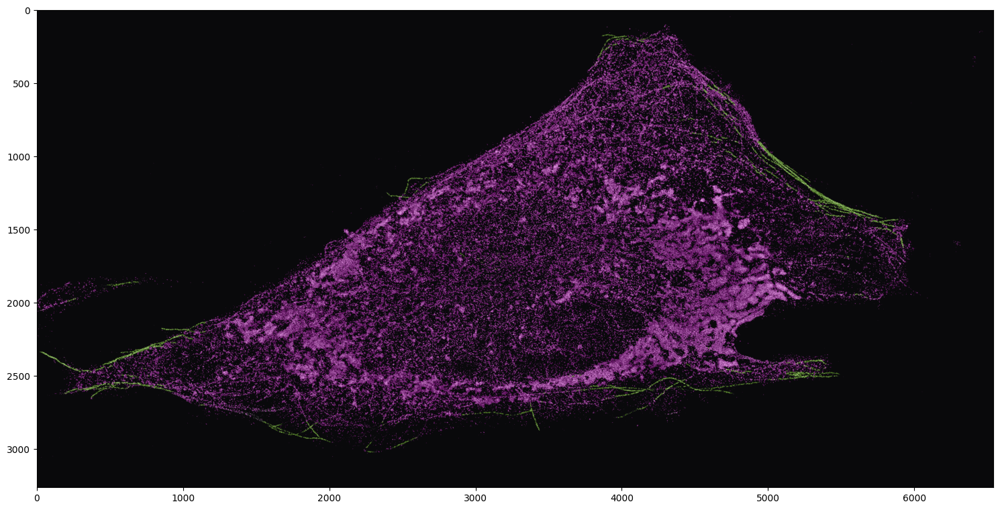

Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


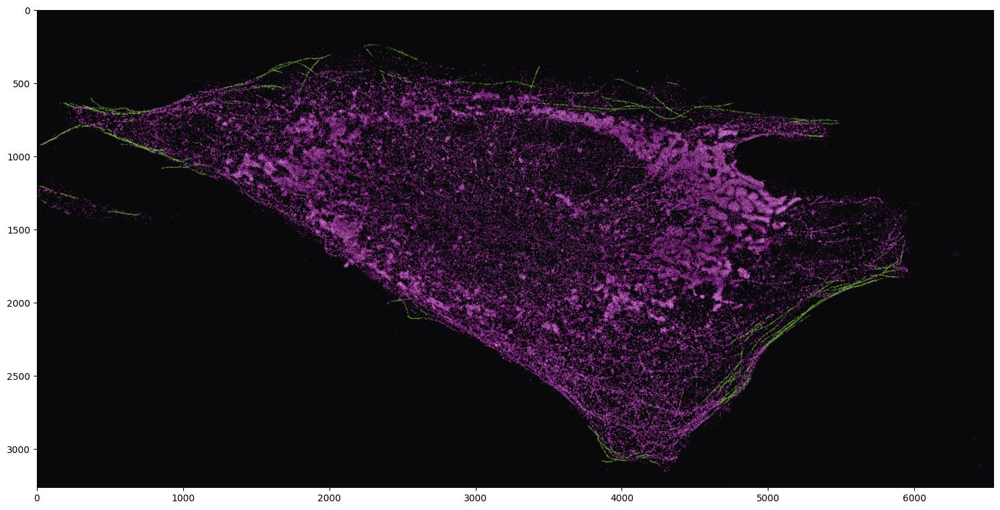

Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


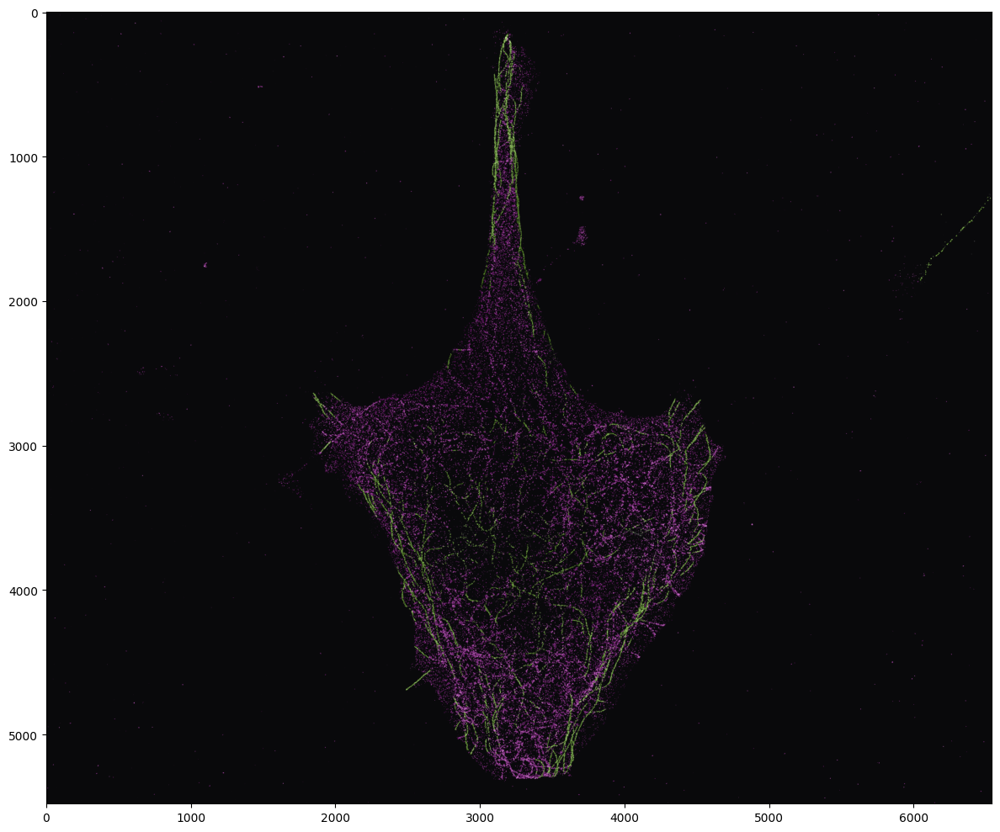

Lossy conversion from float64 to uint8. Range [0.0, 254.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 254.0]. Convert image to uint8 prior to saving to suppress this warning.


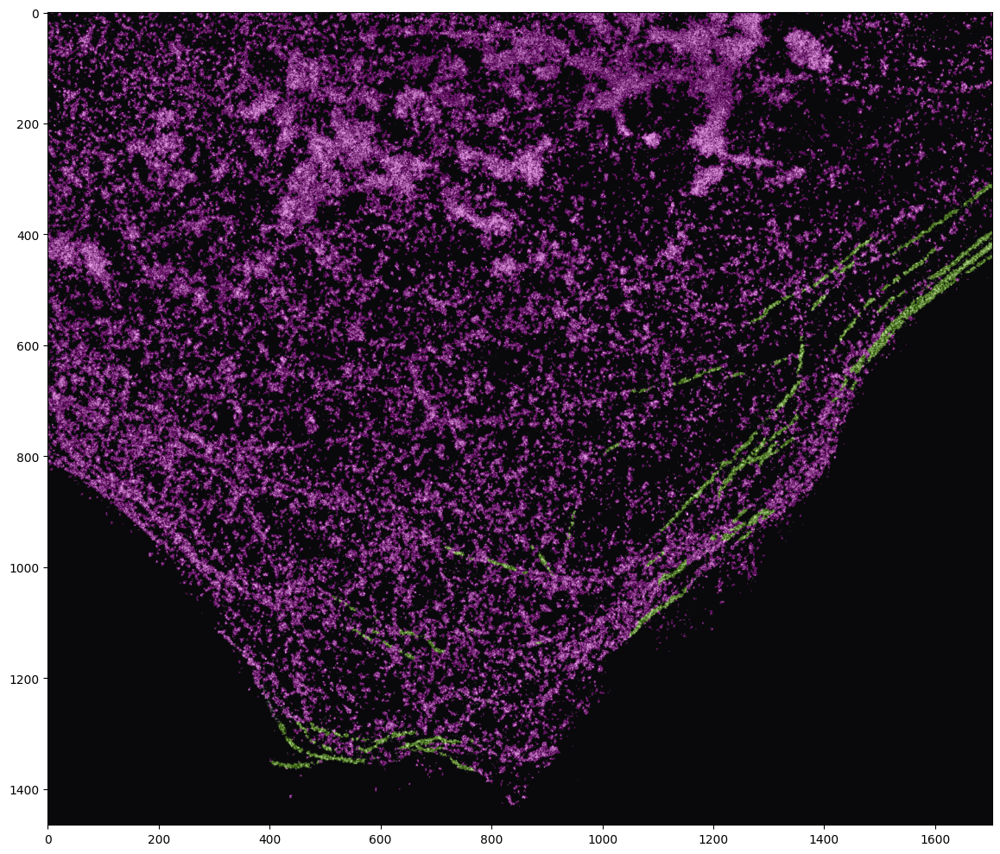

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


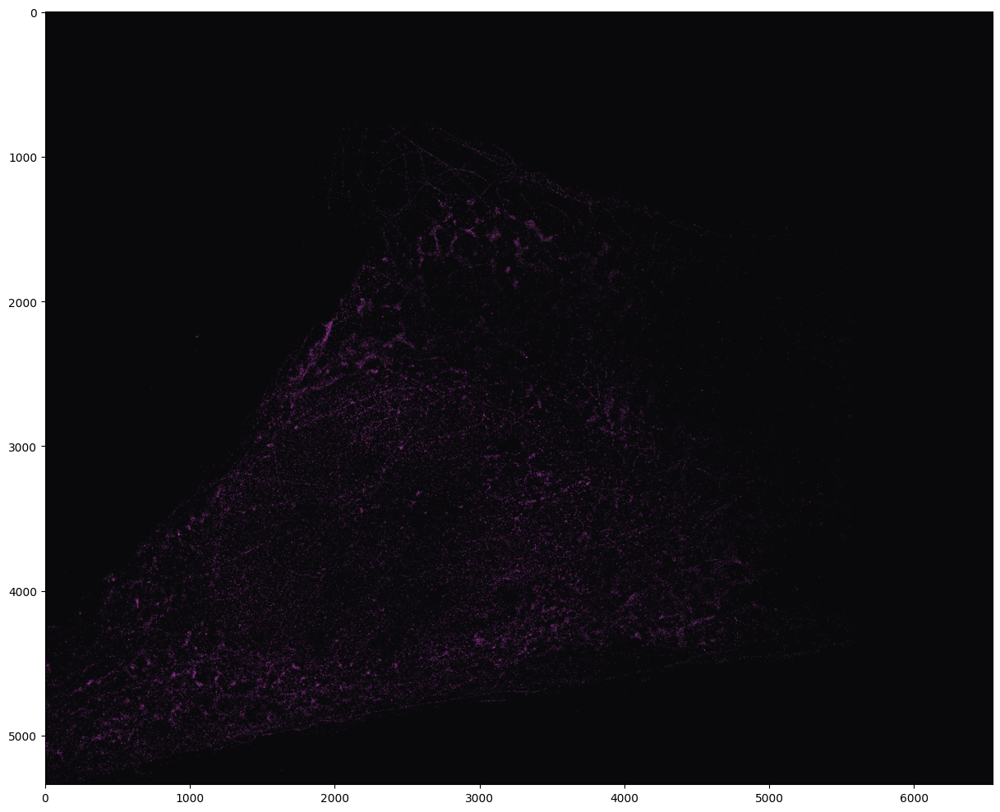

Lossy conversion from float64 to uint8. Range [0.0, 252.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


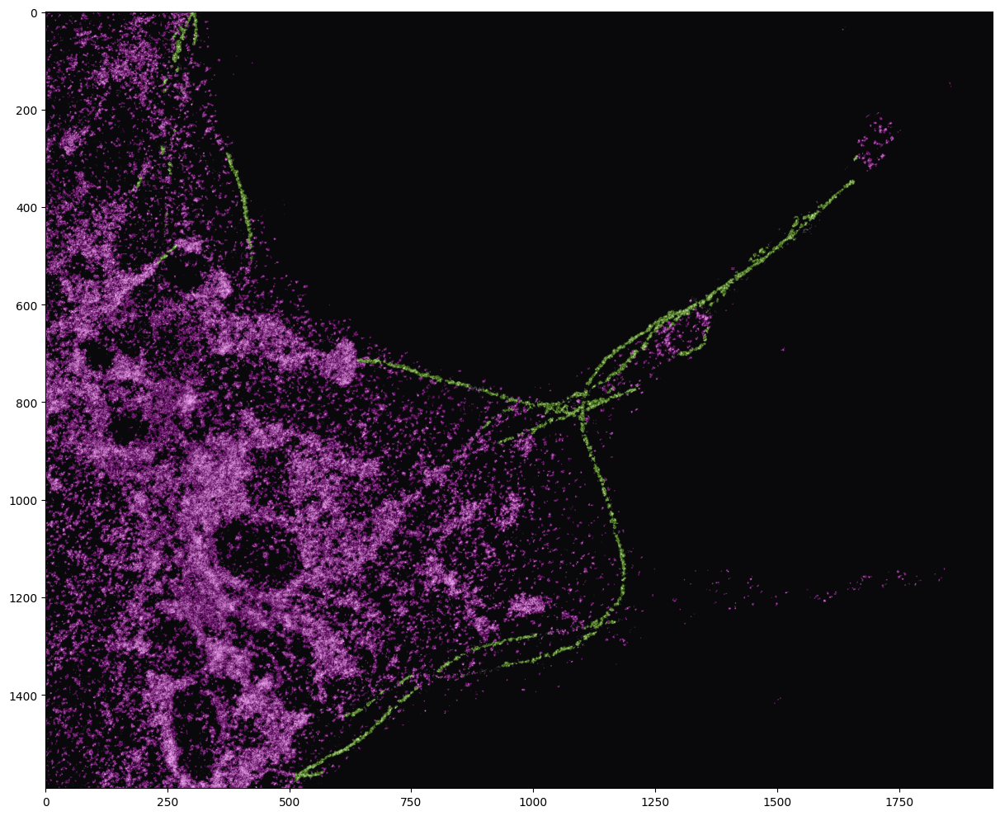

Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


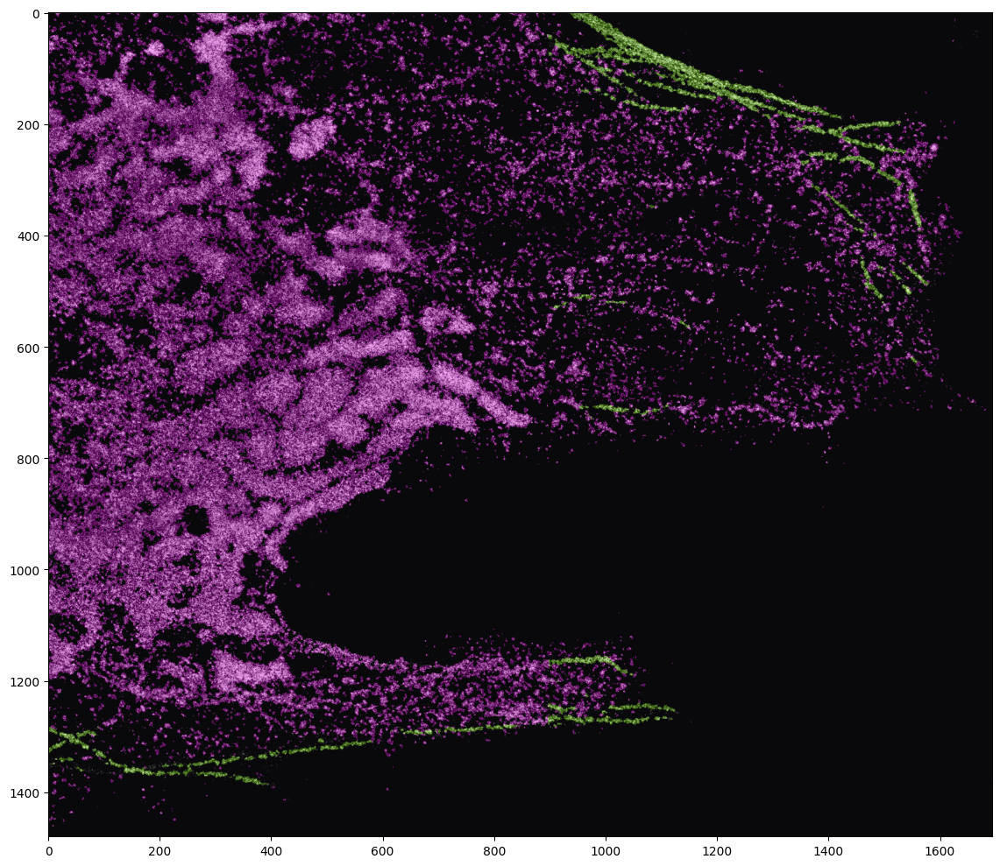

Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


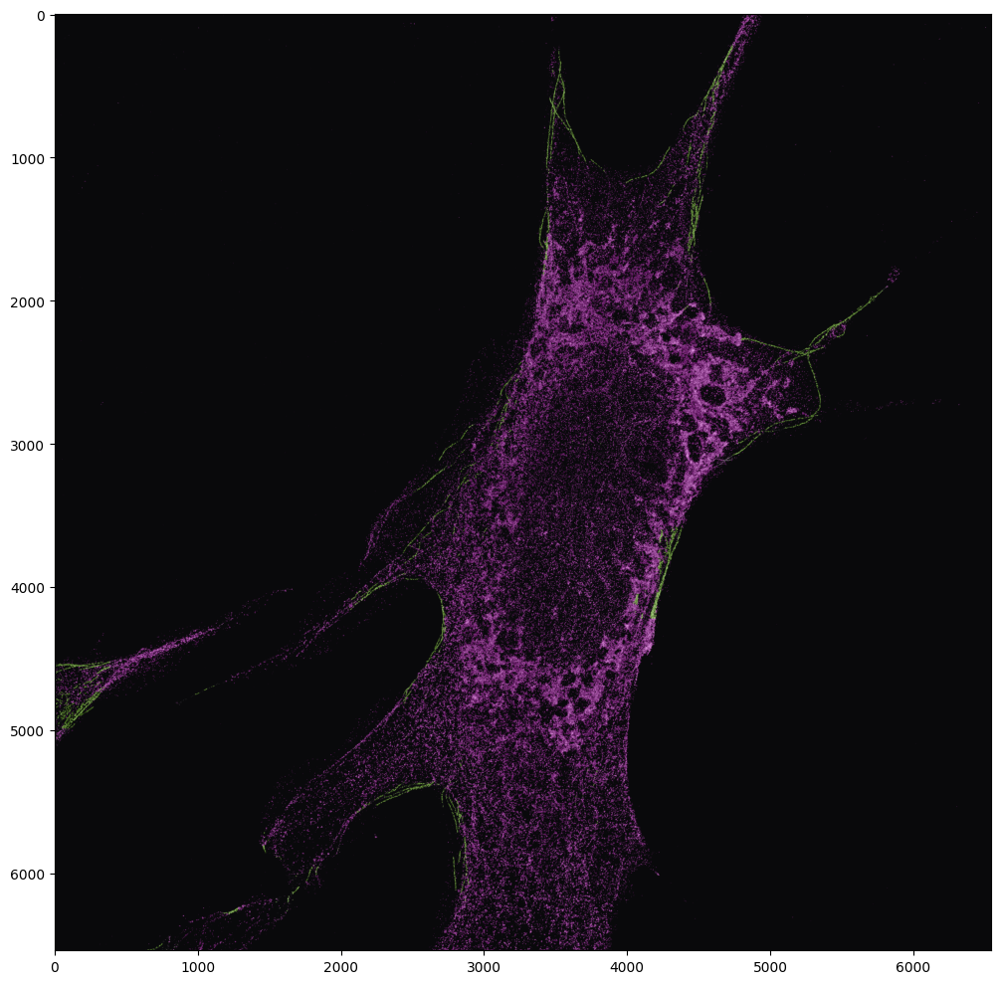

Lossy conversion from float64 to uint8. Range [0.0, 252.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


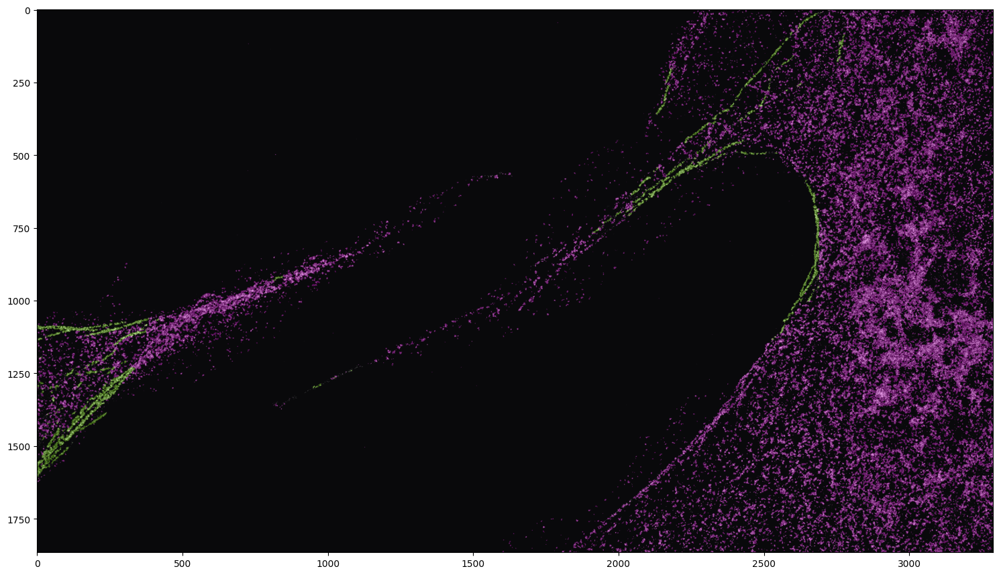

Lossy conversion from float64 to uint8. Range [0.0, 254.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


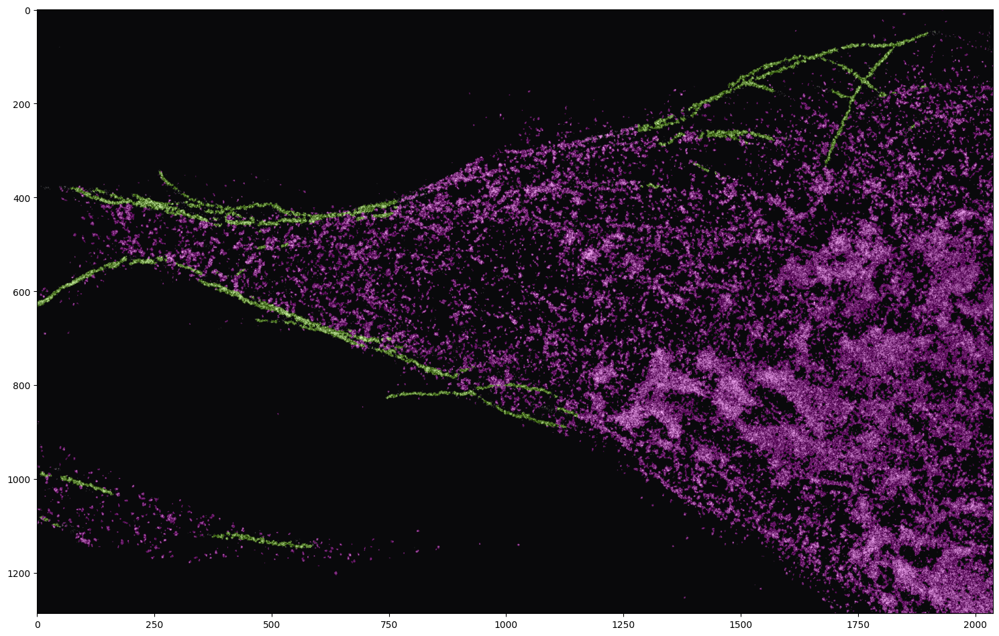

Lossy conversion from float64 to uint8. Range [0.0, 254.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


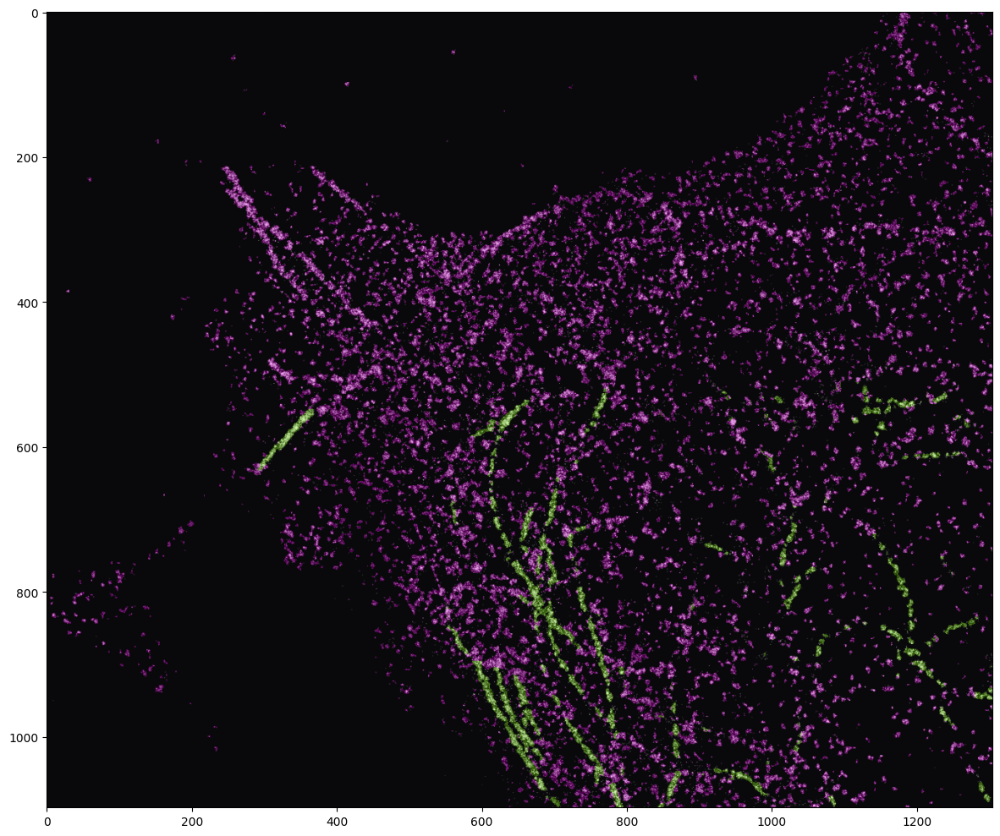

Lossy conversion from float64 to uint8. Range [0.0, 253.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


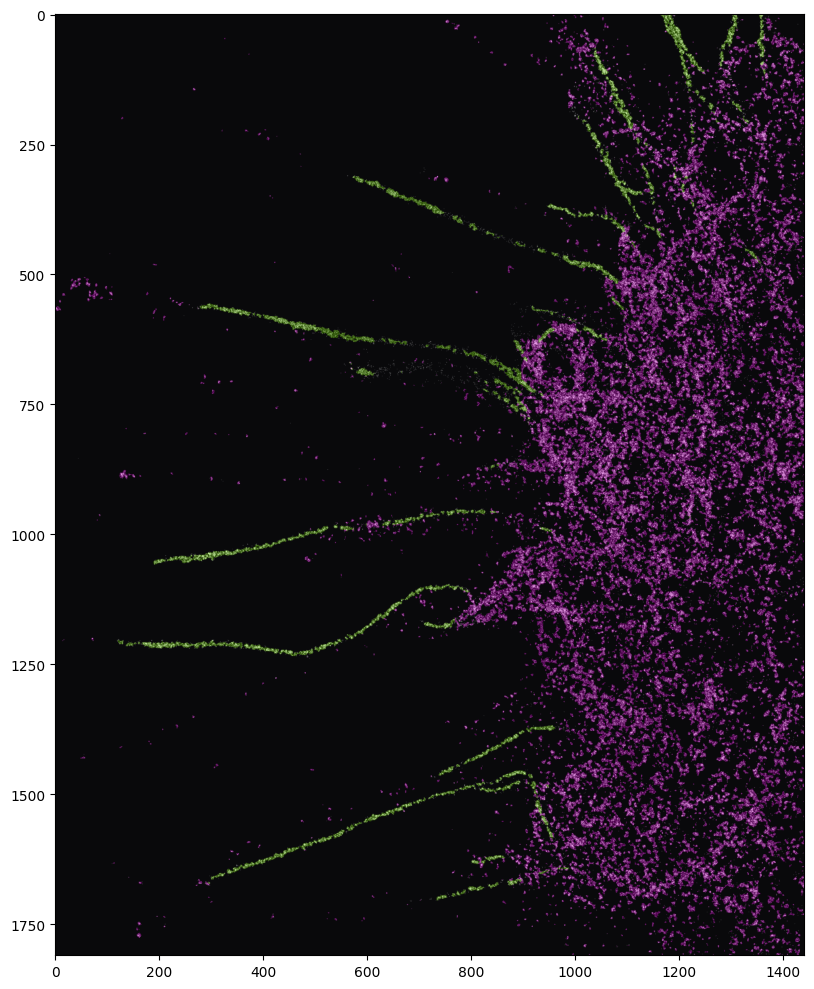

Lossy conversion from float64 to uint8. Range [0.0, 253.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


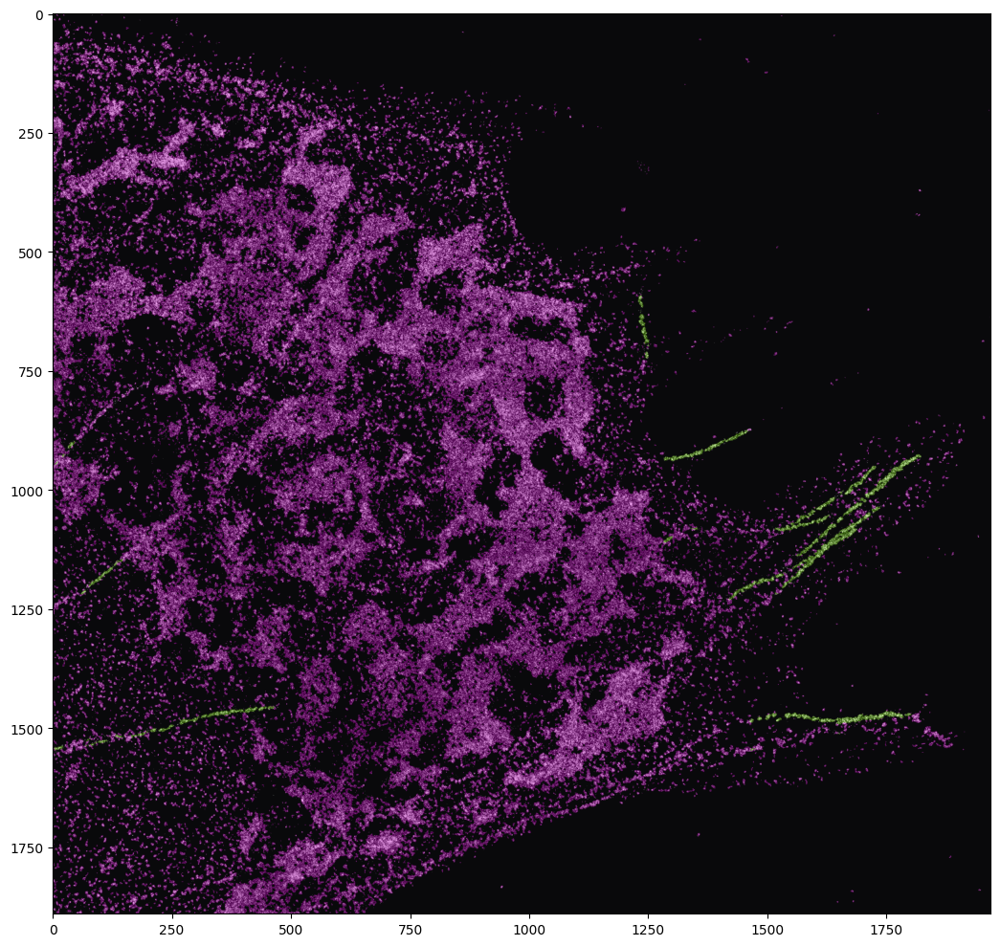

Lossy conversion from float64 to uint8. Range [0.0, 254.0]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0.0, 255.0]. Convert image to uint8 prior to saving to suppress this warning.


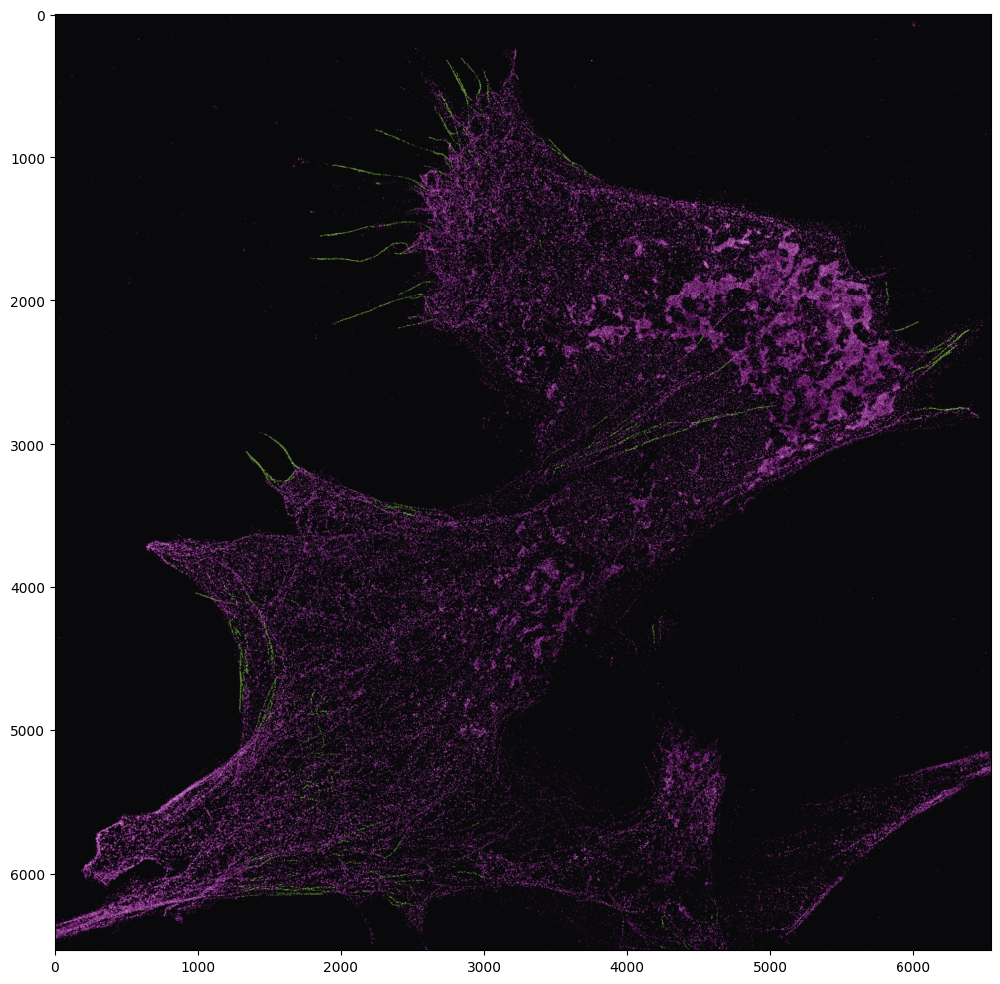

In [8]:
import mmseg.apis
from mmseg.apis import show_result_pyplot
import importlib

from mmseg.apis import inference_segmentor, init_segmentor#, show_result_pyplot
from skimage.io import imread, imshow, imsave
import os
importlib.reload(mmseg.apis)
model.cfg = cfg

# model = init_segmentor(
#     cfg, checkpoint='/home/smlm-workstation/segmentation/mmsegmentation/work_dirs/segformer_b1_adamW_16k/iter_16000_palette.pth')

im_list = [f'/home/smlm-workstation/segmentation/data/archive/mt_er/{fname}' for fname in os.listdir('/home/smlm-workstation/segmentation/data/archive/mt_er')]
i = 0
for im in im_list:
    img = mmcv.imread(im)
    img2 = mmcv.imread(im, flag='grayscale')
   #  img2 = imread(im, as_gray = True)
    result = inference_segmentor(model, img)
    mt, cl = np.zeros(shape=(img.shape[:2])), np.zeros(shape=(img.shape[:2]))
    mmt, mcl = np.array(result[0] == 1), np.array(result[0] == 2)
    mt[mmt] = img2[mmt].astype(np.uint8)
    cl[mcl] = img2[mcl].astype(np.uint8)
    imsave(
        f'/home/smlm-workstation/segmentation/data/results/vitae-b-rvsa-512-potsdam-dice-focal-160k/{i}_MT.png', mt, check_contrast=False)
    imsave(
        f'/home/smlm-workstation/segmentation/data/results/vitae-b-rvsa-512-potsdam-dice-focal-160k/{i}_ER.png', cl, check_contrast=False)
    palette = [[10,10,10],[128, 255, 0], [255, 0, 255]]
    # plt.figure(figsize=(12, 8))
    show_result_pyplot(model, img, result, palette, opacity=0.3,
                       out_file=f'/home/smlm-workstation/segmentation/data/results/vitae-b-rvsa-512-potsdam-dice-focal-160k/{i}_segmap.png')
    i += 1
